In [ ]:
!pip install easyocr

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from easyocr import Reader
import argparse
import cv2
from google.colab.patches import cv2_imshow



In [ ]:
def cleanup_text(text):
  return "".join([c if ord(c) < 128 else "" for c in text]).strip()


[INFO] 0.9920: EASY
[INFO] 0.9555: ENGLISH
[INFO] 0.9901: 444
[INFO] 0.6813: A Letter
[INFO] 0.7464: of_Complaint
[INFO] 0.1184: 45_ ABc
[INFO] 0.9975: Lane
[INFO] 0.9246: Most_letters
[INFO] 0.9710: of
[INFO] 0.5723: Rickshire
[INFO] 0.8428: complaint_use formal
[INFO] 0.1847: ALI 3PH glanguage
[INFO] 0.9717: and
[INFO] 0.4223: are
[INFO] 0.4084: Tel 0l17
[INFO] 0.9084: 934218
[INFO] 0.9335: lorganised
[INFO] 0.9994: in
[INFO] 0.9997: June
[INFO] 0.9928: Zolg
[INFO] 0.5939: standard
[INFO] 0.1918: Wgy"
[INFO] 1.0000: 1
[INFO] 0.9980: Customer
[INFO] 0.8856: Secvices
[INFO] 0.2457: Racagraph
[INFO] 0.9679: Mainrail
[INFO] 0.4502: 1
[INFO] 0.6012: explain_why you
[INFO] 0.9707: Pat_House
[INFO] 0.5301: ace
[INFO] 0.6576: writing
[INFO] 0.9995: Slough
[INFO] 0.9524: SLX_1RT
[INFO] 0.8203: Faragraph
[INFO] 0.4720: 2
[INFO] 0.6868: Deac
[INFO] 0.9998: Sic
[INFO] 0.2488: Oc
[INFO] 0.9932: Madam
[INFO] 0.9913: explain_what_the
[INFO] 0.9794: I
[INFO] 0.2640: Am
[INFO] 0.9894: writing
[INFO] 

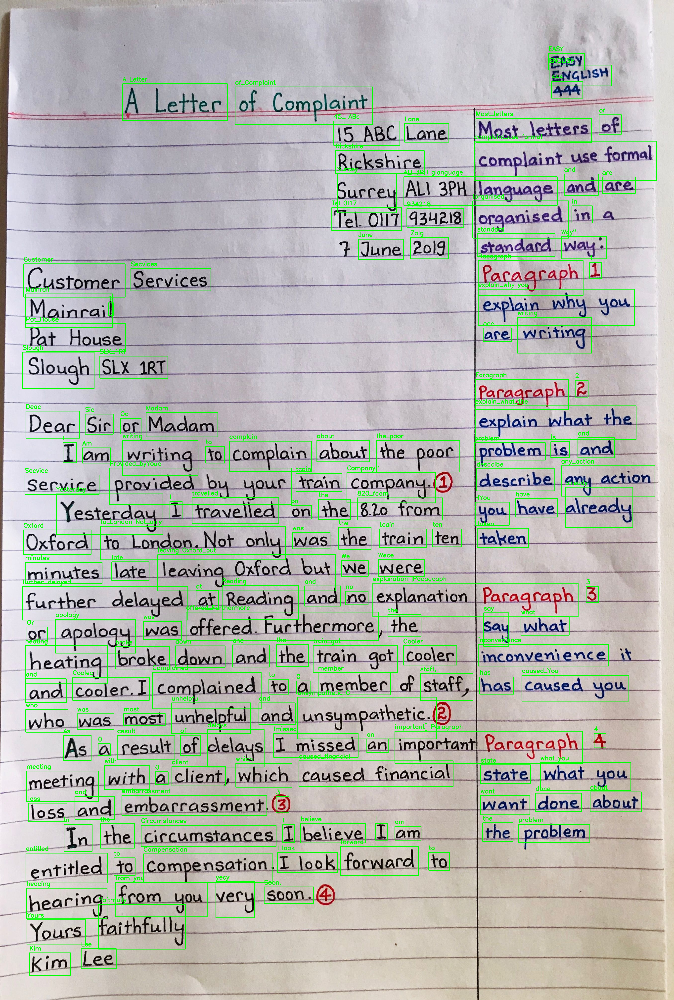

AttributeError: ignored

In [ ]:
# ap = argparse.ArgumentParser()
# ap.add_argument("-i", "--image", required=True,
#                 help="path to input image to be OCR'd")
# ap.add_argument("-l", "--langs", type=str, default="en",
#                 help="comma seperated list of languages to OCR")
# ap.add_argument("-g", "--gpu", type=int, default=-1, 
#                 help="whether or not GPU should be used")

# args = vars(ap.parse_args())

# langs = langs.split(",")
gpu = -1
image = "/content/handwritten.jpg"
# print(f"[INFO] OCR'ing with the following languages e}")
image = cv2.imread(image)
reader = Reader(["en",], gpu=True)
results = reader.readtext(image)

for (bbox, text, prob) in results:
  print(f"[INFO] {prob:.4f}: {text}")
  (tl, tr, br, bl) = bbox
  tl = (int(tl[0]), int(tl[1]))
  tr = (int(tr[0]), int(tr[1]))
  br = (int(br[0]), int(br[1]))
  bl = (int(bl[0]), int(bl[1]))
  # cleanup the text and draw the box surrouding the text along
  # with ocr'd text itself
  text = cleanup_text(text)
  cv2.rectangle(image, tl, br, (0, 255, 0), 2)
  cv2.putText(image, text, (tl[0], tl[1] -10),
              cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)


cv2_imshow(image)
cv2.waitkey(0)

  




In [ ]:
from google.colab import drive
drive.mount('/content/drive')